# DIP Project - Stress Fibers 

### Project Objective:

- Detect cell borders
- Identify stress fibers
- Validate the algorithm's performance through extensive testing and comparison with manual annotations.
- Analyze the length and thickness of the detected stress fibers.


<a id="home"></a>


| Section| Topic |
| :- | :- |
| 1 |  [Image Pre-Proccessing](#Pre_Proccessing) | 
| 2 |  [Cell Borders Detection](#Cell_Borders) | 
| 3 |  [Stress Fibers Fetection](#Fibers) | 
| 4 |  [Analyze](#Analyze) | 




Imports:

In [1]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
from skimage.filters import frangi, threshold_otsu
from skimage.exposure import rescale_intensity
from scipy.ndimage import maximum_filter, minimum_filter
import pandas as pd

[Go to the beginning of the assignment](#home)
<a id="Pre_Proccessing"></a><br/><br/>
<u>Image Pre-Proccessing</u>

In [2]:
def show(*args):
    images = len(args)
    rows = int(np.ceil(images / 5.0))   
    cols = min(5, images)              

    fig, ax = plt.subplots(rows, cols, figsize=(8 * cols, 8 * rows))

    for i, img in enumerate(args):
        if rows == 1:  
            if cols == 1: 
                ax.imshow(img, cmap='gray')
            else:  
                ax[i].imshow(img, cmap='gray')
        else: 
            row = i // 5
            col = i % 5
            ax[row, col].imshow(img, cmap='gray')

    if images < rows * cols:
        for i in range(images, rows * cols):
            fig.delaxes(ax.flatten()[i])
    plt.tight_layout()
    plt.show()

Let's begin by examining the first provided image and analyzing its content:

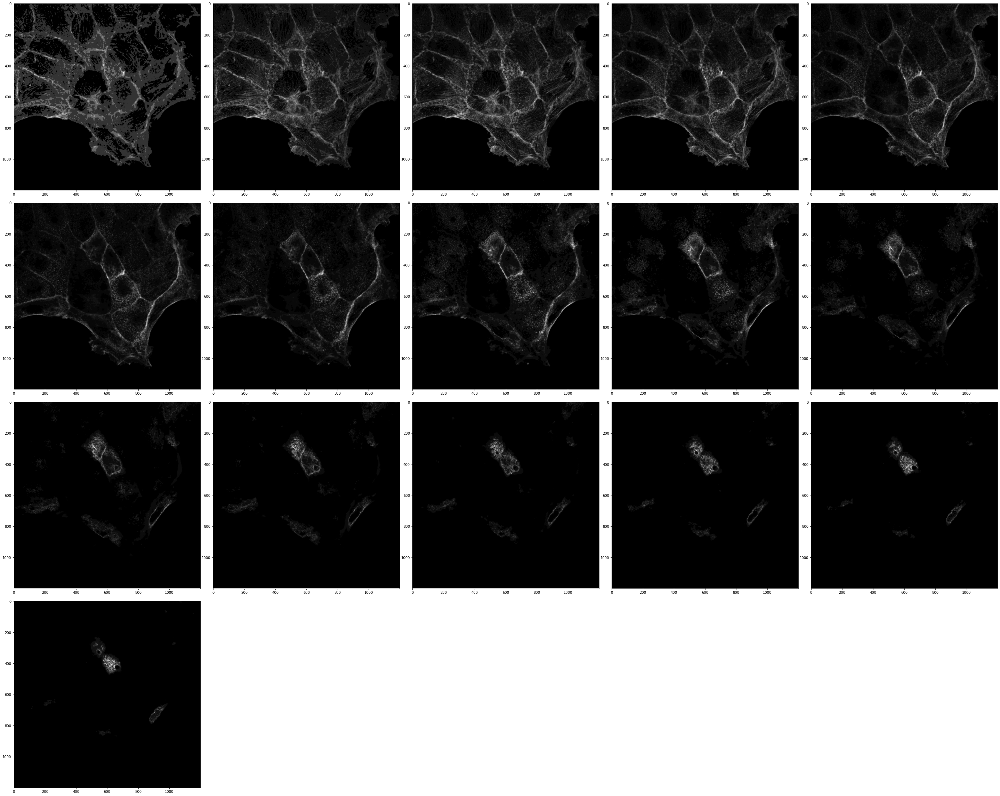

In [3]:
_, image1 = cv2.imreadmulti("pic2.tif")
show(*image1)

Each individual image appears to have low clarity, making it challenging to discern the presence of fibers.






To achieve a clearer image with both cells and fibers, we combine the layers and process them together. 

By combining the layers, we can enhance the visibility of both cell structures and fiber details, resulting in a clearer overall image.

In [4]:
def enhance_contrast(layer):
    if layer.dtype != np.uint8:
        layer = cv2.normalize(layer, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    equalized = cv2.equalizeHist(layer)
    return equalized

def emphasize_boundaries(layer):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    eroded = cv2.erode(layer, kernel, iterations=1)
    dilated = cv2.dilate(eroded, kernel, iterations=1)
    return dilated

def combine_layers(layers):
    combined = np.maximum.reduce(layers)
    combined = cv2.normalize(combined, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    return combined

def process_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
    stacked_layers = cv2.split(image)
    tiff_stack = cv2.imreadmulti(image_path)[1]
    enhanced_layers = []
    for layer in stacked_layers:
        enhanced = enhance_contrast(layer)
        emphasized = emphasize_boundaries(enhanced)
        enhanced_layers.append(emphasized)

    bounded_img = tiff_stack[-1] - tiff_stack[1]
    bounded_img = cv2.GaussianBlur(bounded_img, (35,35), 10)
    bounded_img[bounded_img > 0] = 255

    final_output = combine_layers(enhanced_layers)        
    final_output[bounded_img == 0] = 0
    return final_output

The code applies contrast enhancement and boundary emphasis techniques to each layer of the image. The resulting layers are combined to obtain an output image that highlights the cell boundaries. Additionally, a mask is created using the difference between two specific layers to suppress noise and refine the final output.

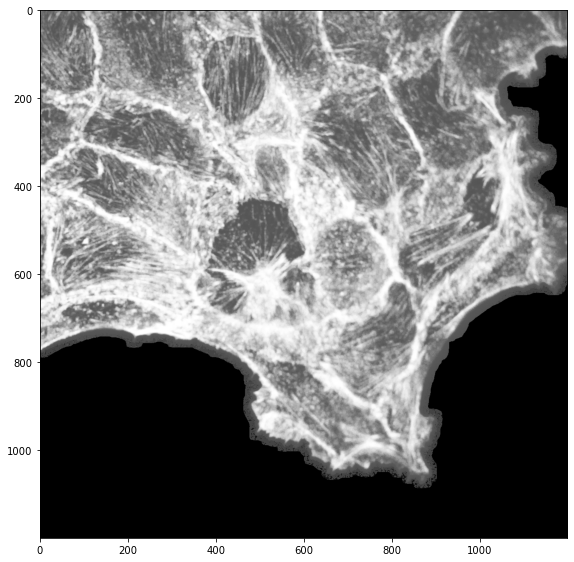

In [5]:
proccessed_image = process_image('pic2.tif')
show(proccessed_image)

The image quality has significantly improved, allowing for better visibility of the fibers and cells compared to previous images. However, it is still overly bright. To address this issue, we will apply gamma correction to adjust the brightness levels.




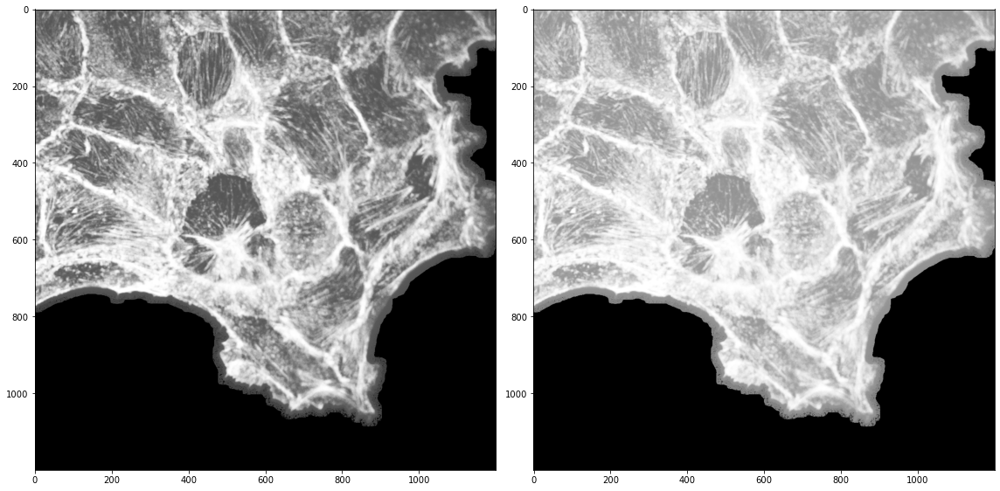

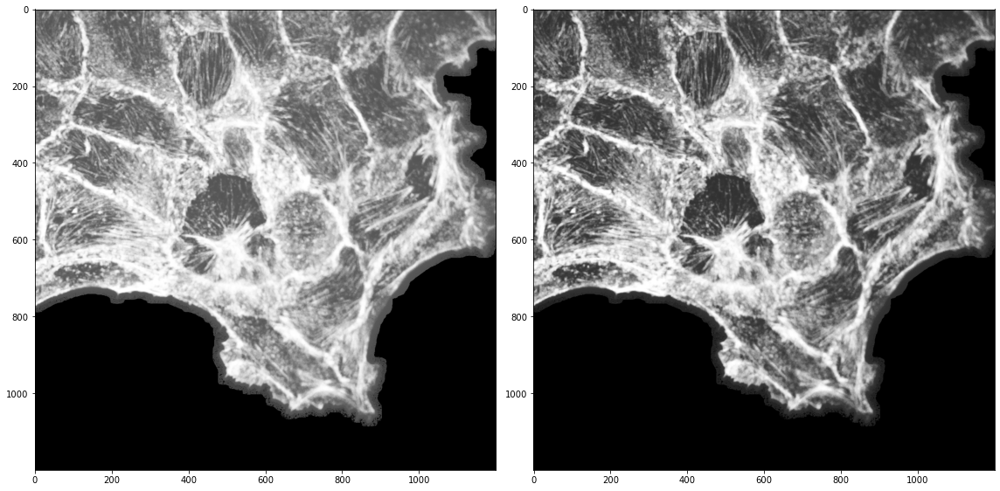

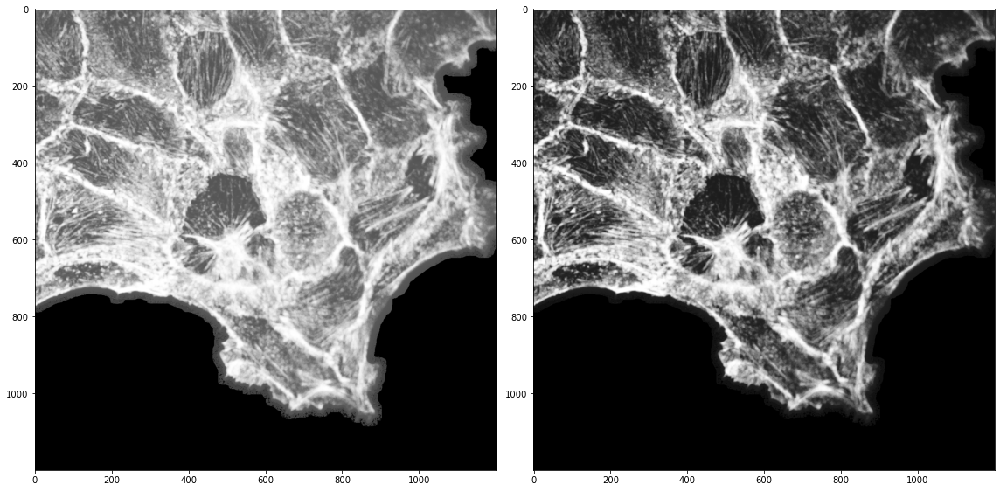

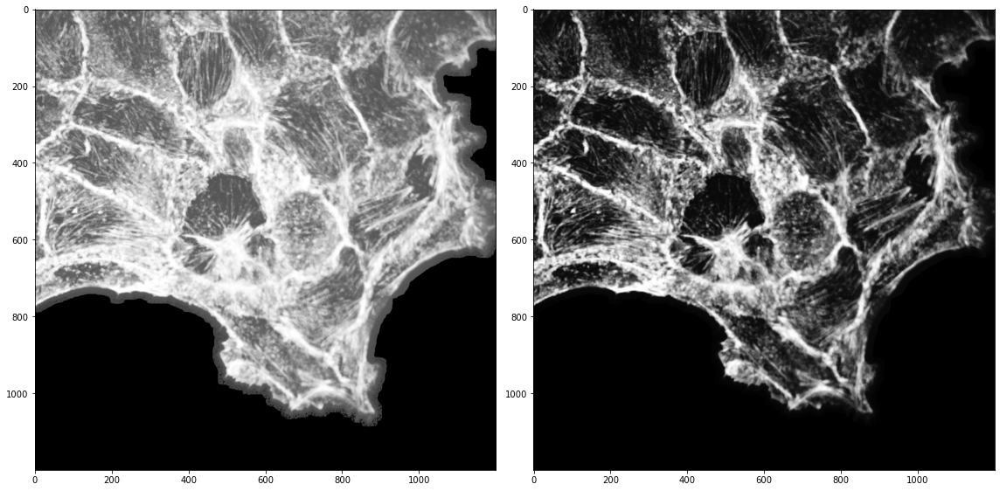

In [6]:
def gamma_correction(img, gamma):
    return (np.power(img, gamma))*255

# Define the values of gamma
gamma_values = [0.5, 1.5, 2, 3]
gamma_images = []

normalized_image = proccessed_image / 255

for i in range(len(gamma_values)):
    gamma = gamma_values[i]
    gamma_correction_image = gamma_correction(normalized_image, gamma)
    gamma_images.append(gamma_correction_image)
    show(proccessed_image, gamma_correction_image)

Let's focus on the fourth image. Although the fibers in this image are not as distinct as in the third image, it is suitable for our current objective of detecting cell borders. 

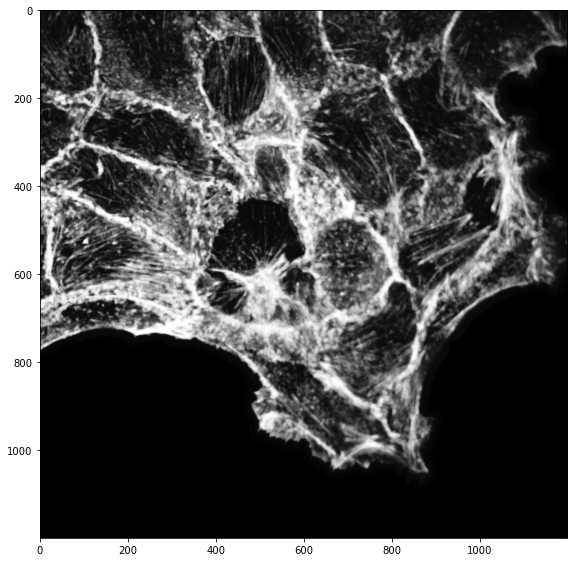

In [7]:
current_image = gamma_images[3]
show(current_image)

Let's check if the image contains noise:

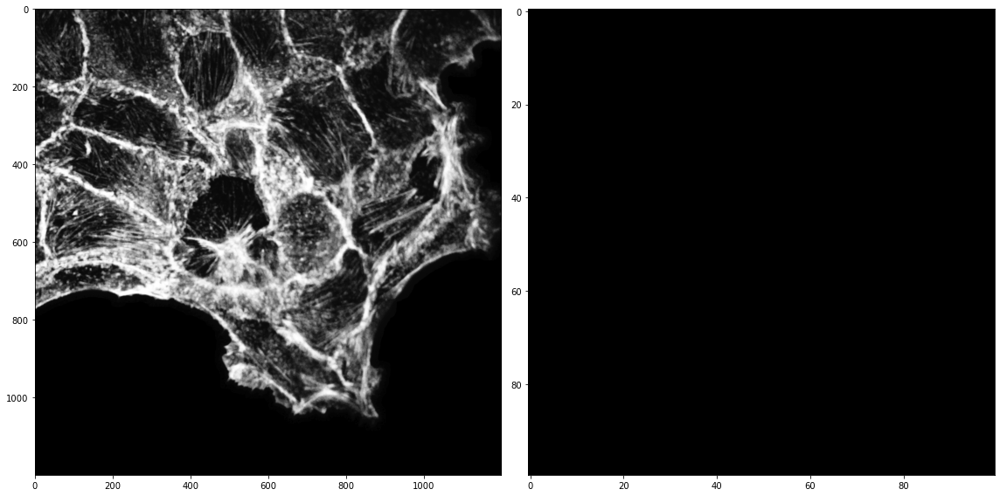

In [8]:
top_left = (1000, 1000) 
bottom_right = (1100, 1100) 

cropped_image = current_image[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]

show(current_image, cropped_image)

In [9]:
def plot_histogram(image):
    plt.hist(image.ravel(), bins=256, color='gray', alpha=0.7)
    plt.title('Histogram')
    plt.xlabel('Pixel Values')
    plt.ylabel('Frequency')
    plt.show()

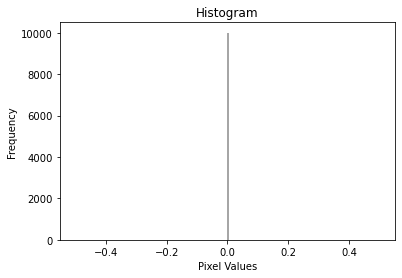

In [10]:
plot_histogram(cropped_image)

Therefore we know that there is no static noise, so we can continue our proccessing.

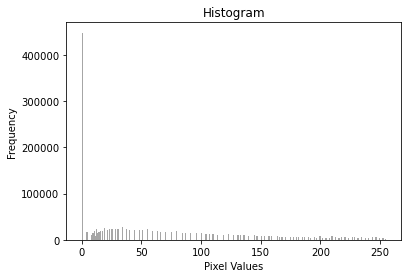

In [11]:
plot_histogram(current_image)

Original unique values: [0.00000000e+00 1.05482507e-01 4.83555556e+00 8.17287197e+00
 9.11501730e+00 9.44444444e+00 9.78171473e+00 1.01269204e+01
 1.04801538e+01 1.08415071e+01 1.12110727e+01 1.19752095e+01
 1.27733026e+01 1.36060900e+01 1.44743099e+01 1.58446905e+01
 1.72989466e+01 1.93727336e+01 2.10323875e+01 2.33890811e+01
 2.52676970e+01 2.79253825e+01 3.07631834e+01 3.45727182e+01
 3.70027528e+01 4.04163322e+01 4.40336486e+01 4.78606075e+01
 5.08719569e+01 5.50800000e+01 5.95139254e+01 6.29911572e+01
 6.66012611e+01 7.03467282e+01 7.55555556e+01 7.96265590e+01
 8.38412303e+01 8.67320569e+01 9.11917109e+01 9.58016763e+01
 1.00564444e+02 1.03825744e+02 1.07156801e+02 1.10558354e+02
 1.14031142e+02 1.19375502e+02 1.23029604e+02 1.26757524e+02
 1.30560000e+02 1.32489427e+02 1.36405121e+02 1.40397216e+02
 1.44466451e+02 1.46530227e+02 1.50716555e+02 1.52839293e+02
 1.57144375e+02 1.59326905e+02 1.63752403e+02 1.65995556e+02
 1.68259100e+02 1.70543130e+02 1.75173010e+02 1.77519047e+02


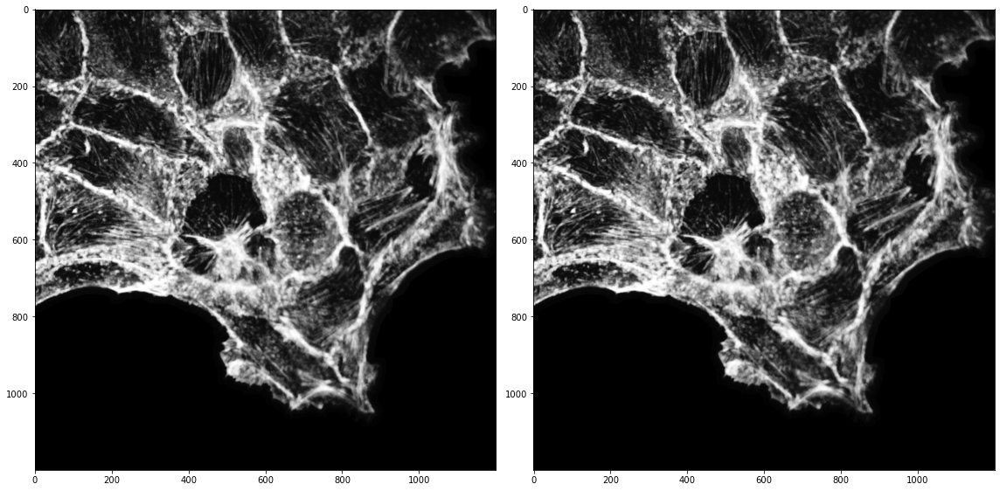

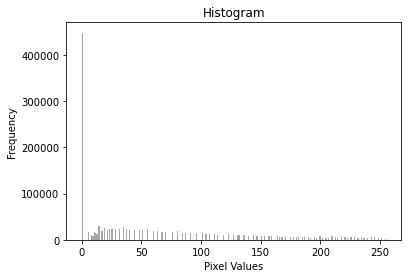

In [12]:
normalized_image = cv2.normalize(current_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

print("Original unique values:", np.unique(current_image))
print("Normalized unique values:", np.unique(normalized_image))

show(current_image, normalized_image)

plot_histogram(normalized_image)

[Go to the beginning of the assignment](#home)
<a id="Cell_Borders"></a><br/><br/>
<u>Detect Cell Borders</u>

Now we apply Gaussian blur and inverse binary thresholding to the input image, producing a thresholded image.



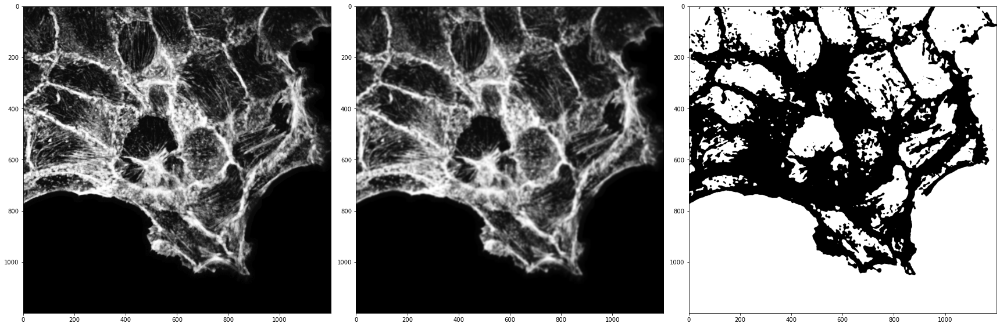

In [13]:
blur = cv2.GaussianBlur(normalized_image, (13, 13), 0)
ret, thresh = cv2.threshold(blur, 60, 255, cv2.THRESH_BINARY_INV)

show(normalized_image, blur, thresh)

Now we perform morphological opening on the thresholded image for reducing noise and producing a smoother image.

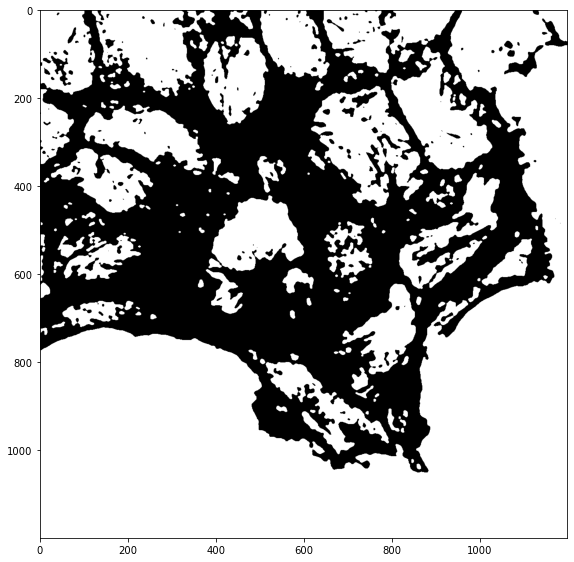

In [14]:
kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel_open)
show(thresh)

Now, we apply morphological closing, resulting in the merging of nearby regions and filling small gaps to enhance the overall image quality.

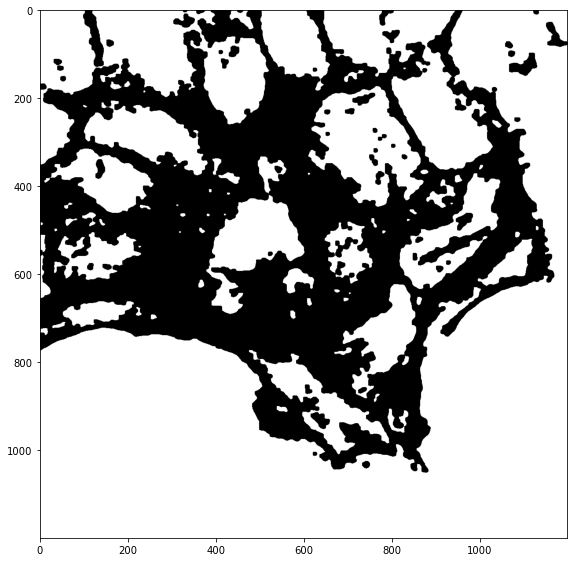

In [15]:
kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel_close)
show(thresh)

This code snippet applies connected component analysis to the thresholded image, extracting statistical information and centroid coordinates. It then creates a mask by filtering out small components based on a minimum fiber length threshold, resulting in a mask that highlights the detected cells.

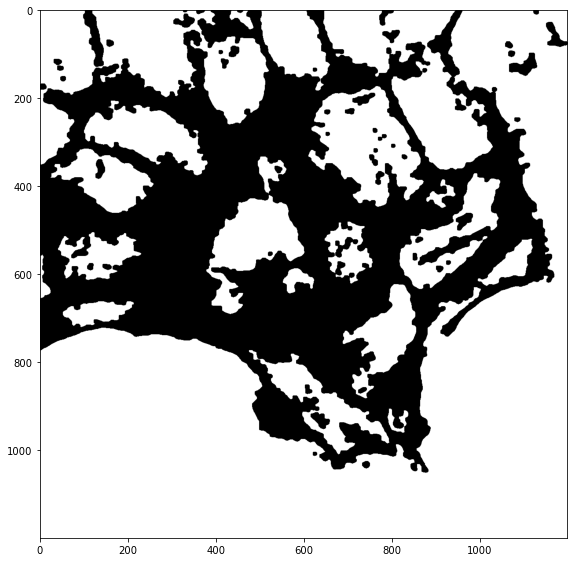

In [16]:
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)

min_fiber_length = 50
cells_mask = np.zeros_like(thresh)

for i in range(1, num_labels):
    if max(stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]) > min_fiber_length:
        cells_mask[labels == i] = 255

show(cells_mask)

We perform more morphological operations - erosion and dilation 

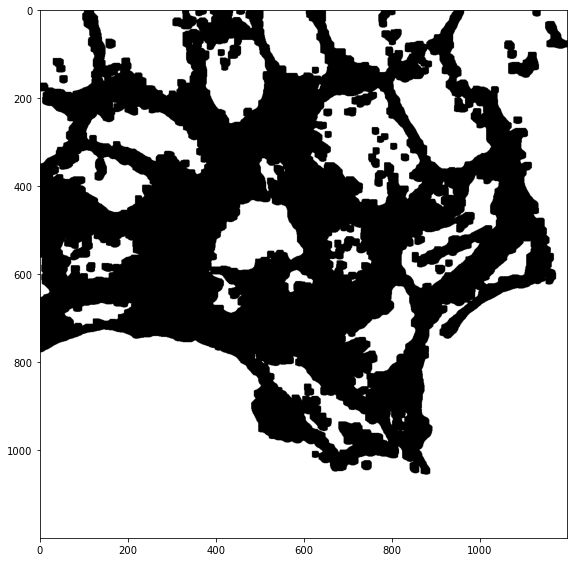

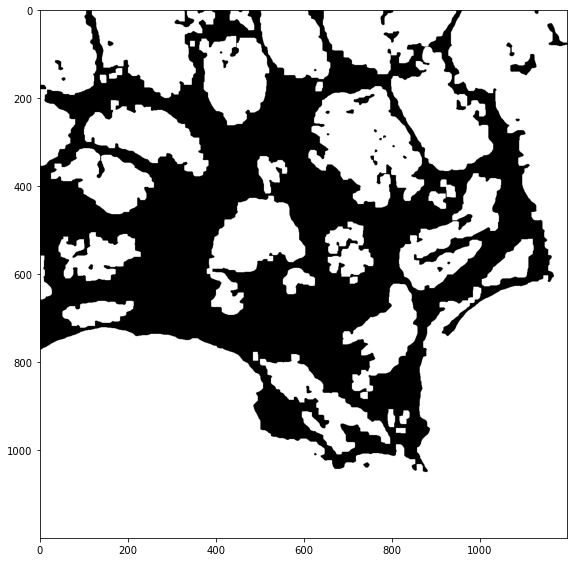

In [17]:
shape = cv2.MORPH_RECT
kernel_size = (4,)*2
kernel = cv2.getStructuringElement(shape, kernel_size)
cells_mask = cv2.erode(cells_mask, kernel, iterations=2)
show(cells_mask)

kernel_size = (11,)*2
kernel = cv2.getStructuringElement(shape, kernel_size)
cells_mask = cv2.dilate(cells_mask, kernel)
show(cells_mask)

Eventually, we have:

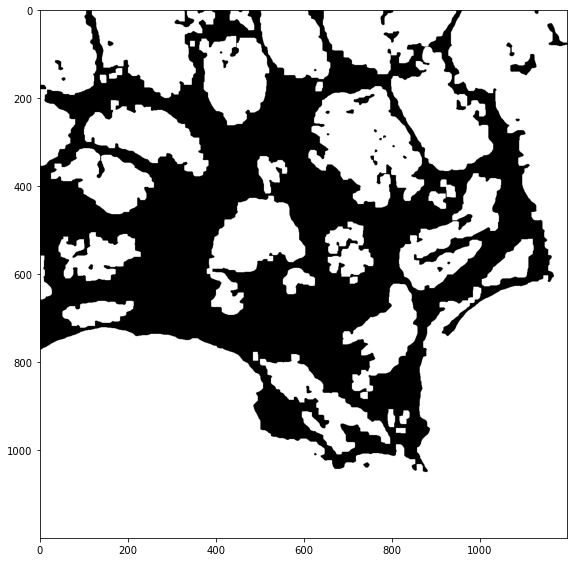

In [18]:
show(cells_mask)

We detected the border cells effectively.


To enhance the visibility of fibers in an image, we subtract the cell borders from the image. 

By subtracting the cell borders, the image can be processed in a way that the fibers become more prominent and easier to distinguish.

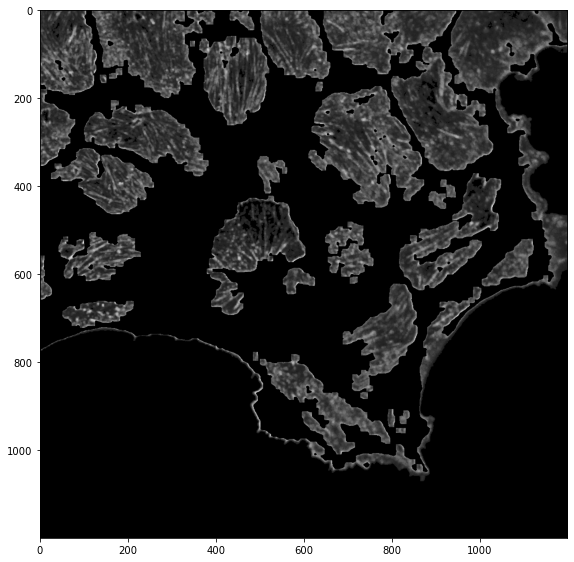

In [19]:
test = gamma_images[2].copy()
test[cells_mask == 0] = 0
test[gamma_images[2] <= 30]=0
show(test)


[Go to the beginning of the assignment](#home)
<a id="Fibers"></a><br/><br/>
<u>Identify Stress Fibers</u>

Now we will try to detect the fibers

In [20]:
def equalize_hist(img):
    hist, bins = np.histogram(img.flatten(), bins=256, range=[0,255])
    cdf = hist.cumsum()
    cdf_normalized = cdf * hist.max() / cdf.max()
    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')
    
    img_out = cdf[img.flatten().astype('uint8')]
    img_out = np.reshape(img_out, img.shape)

    return img_out

def normalize(img):
    return (img - np.min(img))/(np.max(img)- np.min(img))*255

def convert_gray_to_rgb(image):
    image_rgb = np.stack((image,)*3, axis=-1)
    return image_rgb

def threshold_image(image, threshold=10, max_value=255):
    thresholded_image = np.where(image > threshold, max_value, 0).astype('uint8')
    return thresholded_image

In [21]:
def get_structuring_element(size):
    return np.ones(size, np.uint8)

def dilation(image, selem):
    padded_image = np.pad(image, ((selem.shape[0]//2, selem.shape[0]//2), (selem.shape[1]//2, selem.shape[1]//2)), 'constant')
    dilated_image = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            dilated_image[i, j] = np.max(padded_image[i:i+selem.shape[0], j:j+selem.shape[1]][selem==1])
    return dilated_image

def erosion(image, selem):
    padded_image = np.pad(image, ((selem.shape[0]//2, selem.shape[0]//2), (selem.shape[1]//2, selem.shape[1]//2)), 'constant')
    eroded_image = np.zeros_like(image)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            eroded_image[i, j] = np.min(padded_image[i:i+selem.shape[0], j:j+selem.shape[1]][selem==1])
    return eroded_image

def opening(image, selem):
    return dilation(erosion(image, selem), selem)

def top_hat_transform(image, selem):
    return image - opening(image, selem)

In order to enhance visibility, we perform histogram equalization which improves the contrast and overall visual quality.


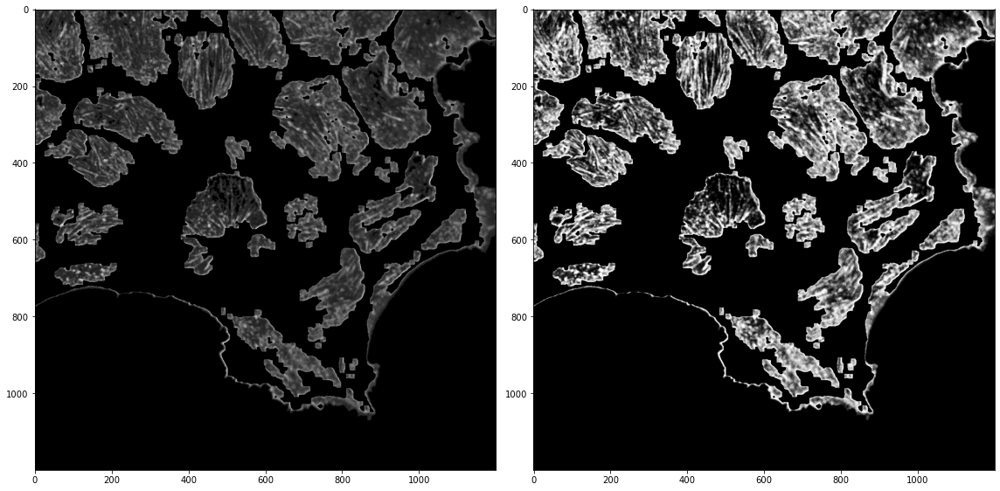

In [22]:
equalized_image1 = equalize_hist(test)
show(test, equalized_image1)

This code snippet aims to identify and highlight fibers in an image. 
It starts by performing a top-hat transformation and applying a threshold to detect fiber-like structures. 
Connected component analysis is then applied to filter out small components based on a minimum fiber length threshold. 
The Hough lines transform is utilized to detect lines corresponding to the fibers, and these lines are highlighted in the original image using color masking. 
The final result is displayed, showcasing the normalized image, thresholded image, fiber mask, and the original image with highlighted fibers.

In [23]:
def identify_fibers(image):
    selem = get_structuring_element((1, 15))
    tophat = top_hat_transform(image, selem)
    tophat = threshold_image(tophat, 40, 255)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(tophat, connectivity=8)

    min_fiber_length = 20
    fiber_mask = np.zeros_like(tophat)

    for i in range(1, num_labels):
        if max(stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]) > min_fiber_length:
            fiber_mask[labels == i] = 255

    lines = cv2.HoughLinesP(fiber_mask, rho=1, theta=np.pi/180, threshold=10, minLineLength=5, maxLineGap=10)
    image_color = convert_gray_to_rgb(normalized_image)

    color_mask = np.zeros_like(image_color)
    color_mask[fiber_mask == 255] = [0, 0, 255]
    
    highlighted_image = cv2.addWeighted(image_color, 1.0, color_mask, 0.5, 0)

    show(normalized_image,image, fiber_mask, highlighted_image)

#### Advantages:

- The use of a top-hat transformation and thresholding helps to enhance and segment fiber-like structures in the image.
- Connected component analysis allows for filtering out small components based on a minimum fiber length threshold, helping to identify longer and more prominent fibers.
- The Hough lines transform provides a means to detect lines corresponding to the fibers, aiding in their identification and analysis.
- The visual highlighting of fibers in the original image using color masking facilitates their visualization and interpretation.

#### Limitations:

- The effectiveness of this method heavily relies on appropriate parameter tuning, such as the threshold values and minimum fiber length.
- It may struggle to accurately detect fibers that are thin, fragmented, or densely packed, as they might not meet the criteria for length or exhibit clear line properties for Hough line detection.
- The method assumes that fibers are well-separated from other structures, and may not perform optimally in the presence of overlapping or intertwined fibers.
- Variations in image quality, noise, or lighting conditions could impact the accuracy of fiber detection.

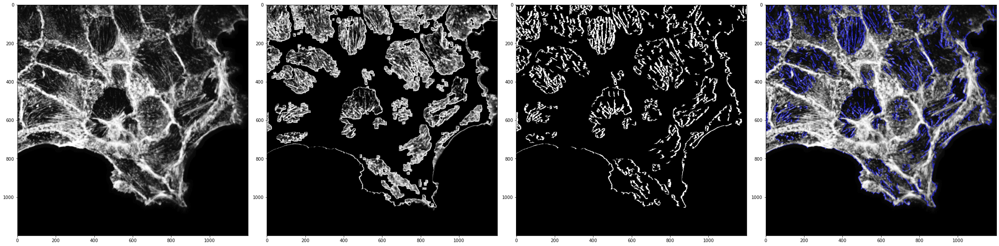

In [24]:
identify_fibers(equalized_image1)

Although the results of the fiber identification method are reasonably good, it seems to have limitations in accurately detecting all fibers and may even detect the cell borders instead.

In [25]:
def CannyEdgeDetector(input_image, threshold1, threshold2):
    input_image = cv2.GaussianBlur(input_image, (5, 5), np.sqrt(2))
    input_image = cv2.normalize(input_image, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    grad = cv2.Canny(input_image, threshold1, threshold2)
    
    strong = grad > threshold2
    weak = (grad > threshold1) & (grad <= threshold2)
    
    result = np.zeros_like(grad, dtype=np.uint8)
    result[strong] = 255

    for (i, j), value in np.ndenumerate(weak):
        if value:
            if np.any(strong[i-1:i+2, j-1:j+2]):
                result[i, j] = 255
    
    return result

def detect_lines(image, rho=1, theta=np.pi/180, threshold=10, min_line_len=40, max_line_gap=20):
    lines = cv2.HoughLinesP(image, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_image = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.uint8)

    if lines is not None:  
        for line in lines:
            for x1,y1,x2,y2 in line:
                cv2.line(line_image, (x1, y1), (x2, y2), [255, 0, 0], 2)
    else:
        print("No line was detected")
        
    return line_image

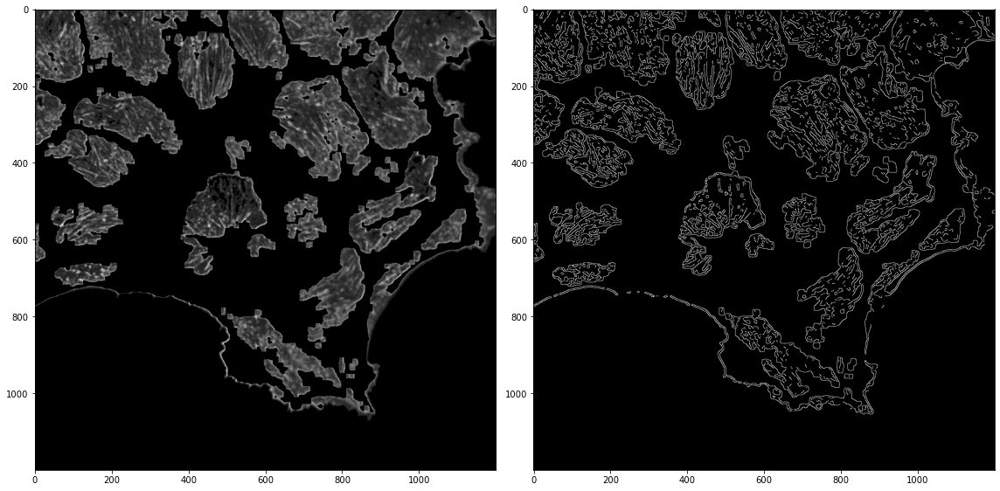

In [26]:
edge_image = CannyEdgeDetector(equalized_image1, 200, 250) 
show(test, edge_image)

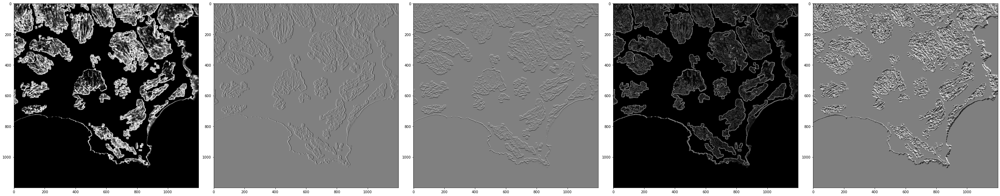

In [27]:
sobel_x = cv2.Sobel(equalized_image1, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(equalized_image1, cv2.CV_64F, 0, 1, ksize=3)

gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_direction = np.arctan2(sobel_y, sobel_x)

gradient_magnitude_normalized = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
show(equalized_image1, sobel_x, sobel_y, gradient_magnitude_normalized, gradient_direction)

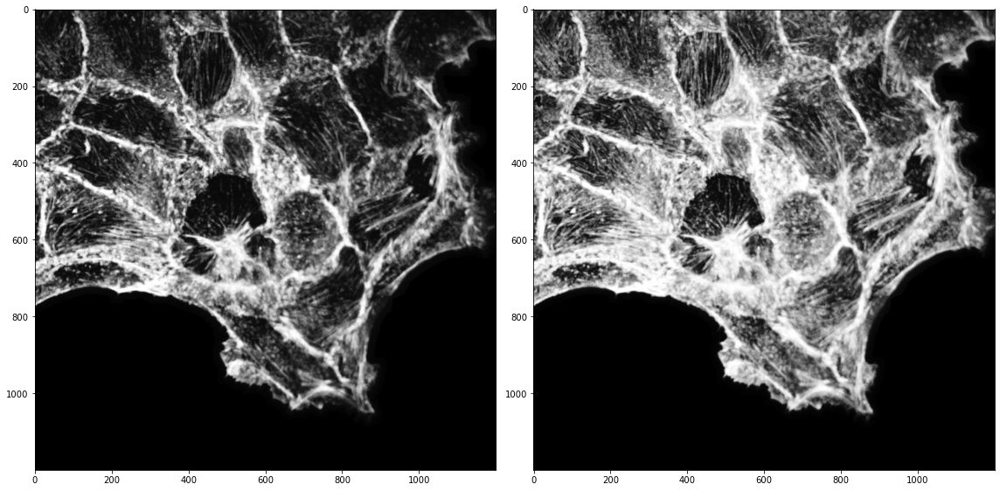

In [28]:
equalized_image2 = equalize_hist(normalized_image)
show(normalized_image, equalized_image2)

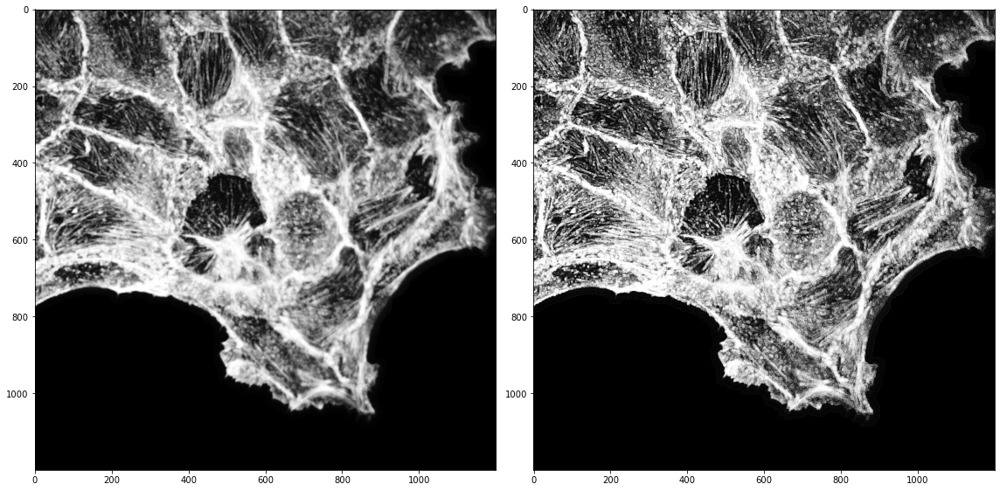

In [29]:
def sharpen_image(image):
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])

    sharpened_image = cv2.filter2D(image, -1, kernel)

    return sharpened_image

sharpened_image = sharpen_image(equalized_image2)
show(equalized_image2, sharpened_image)

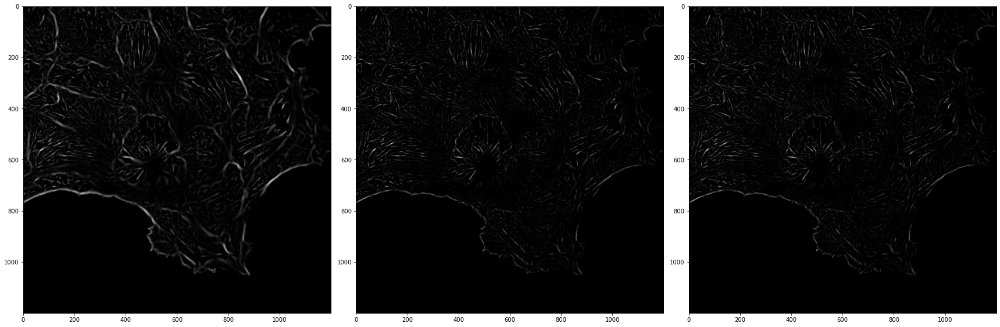

In [30]:
filtered_frangi = frangi(sharpened_image, np.arange(1,7, 1), black_ridges=False)
filtered_frangi1 = frangi(sharpened_image, np.arange(0.5,3, 0.8), beta=0.3, black_ridges=False)
filtered_frangi2 = frangi(sharpened_image, np.arange(0.5,3, 0.8), beta=0.3, gamma=0.7, black_ridges=False)

show(filtered_frangi, filtered_frangi1, filtered_frangi2)

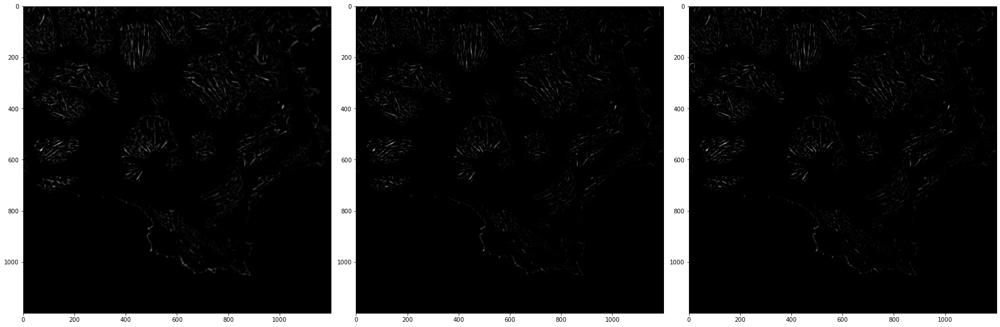

In [31]:
filtered_frangi[cells_mask == 0] = 0  
filtered_frangi1[cells_mask == 0] = 0 
filtered_frangi2[cells_mask == 0] = 0 

show(filtered_frangi, filtered_frangi1, filtered_frangi2)

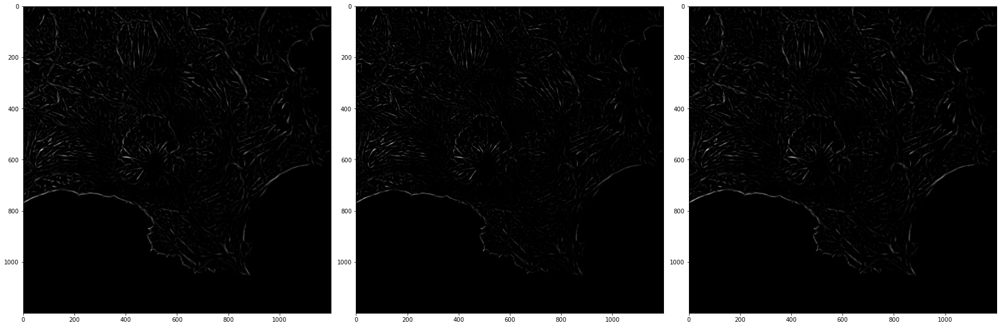

In [32]:
filtered_frangi = frangi(equalized_image2, np.arange(0.6,3, 0.3), black_ridges=False)
filtered_frangi1 = frangi(equalized_image2, np.arange(0.5,3, 1.5), beta=0.3, black_ridges=False)
filtered_frangi2 = frangi(equalized_image2, np.arange(0.5,3, 0.8), beta=0.3, gamma=0.7, black_ridges=False)

show(filtered_frangi, filtered_frangi1, filtered_frangi2)

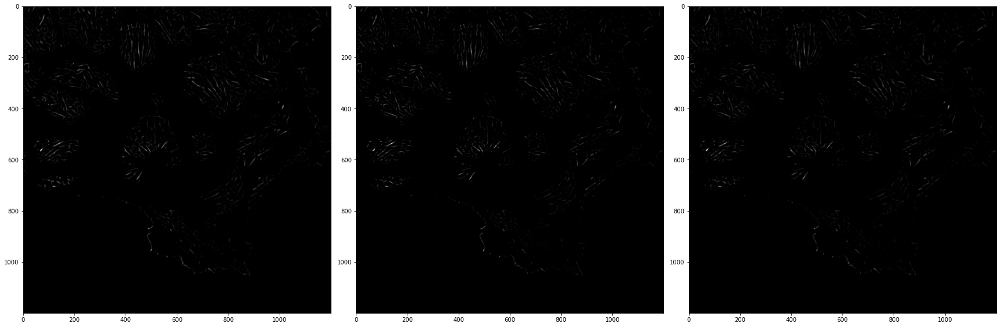

In [33]:
filtered_frangi[cells_mask == 0] = 0  
filtered_frangi1[cells_mask == 0] = 0 
filtered_frangi2[cells_mask == 0] = 0 

show(filtered_frangi, filtered_frangi1, filtered_frangi2)

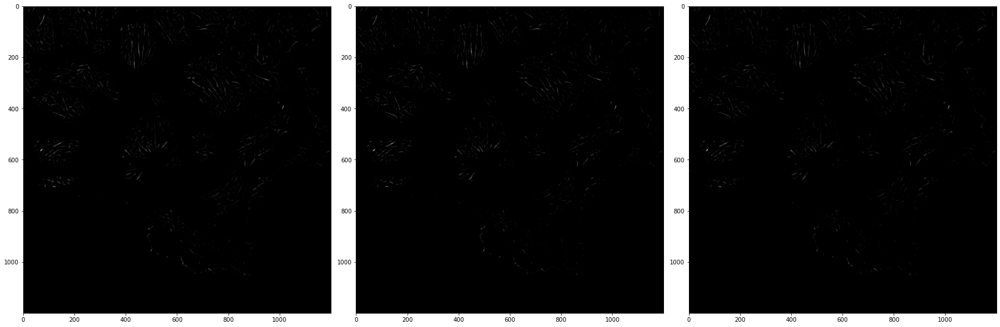

In [34]:
filtered_frangi = minimum_filter(filtered_frangi, 2)  
filtered_frangi1 = minimum_filter(filtered_frangi1, 2) 
filtered_frangi2 = minimum_filter(filtered_frangi2, 2) 

show(filtered_frangi, filtered_frangi1, filtered_frangi2)

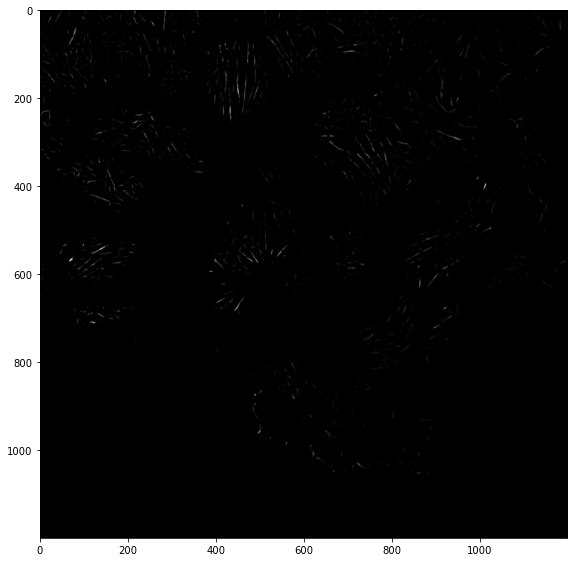

In [35]:
ed_frangi = cv2.dilate(filtered_frangi1, (10,)*2)
ed_frangi = cv2.erode(ed_frangi, (5,)*2)

ed_frangi = cv2.dilate(ed_frangi, (9,)*2)
ed_frangi = cv2.erode(ed_frangi, (3,)*2)

ed_frangi = cv2.erode(ed_frangi, (5,)*2)
ed_frangi = cv2.dilate(ed_frangi, (5,)*2)

ed_frangi = cv2.erode(ed_frangi, (15,)*2)
ed_frangi = cv2.dilate(ed_frangi, (5,)*2)

show(ed_frangi)

Original unique values: [0.00000000e+00 2.68841173e-18 2.96440079e-18 ... 6.40471628e-05
 6.63743297e-05 6.65072752e-05]
Normalized unique values: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 128 129 130 131 133 134 135 136 137 138 139 140 141 142 143 144 145
 146 147 148 149 150 151 155 156 158 160 161 163 164 166 167 168 170 171
 172 174 175 176 177 180 181 182 183 184 185 188 189 193 194 200 205 206
 207 218 219 223 226 228 232 239 244 246 254 255]


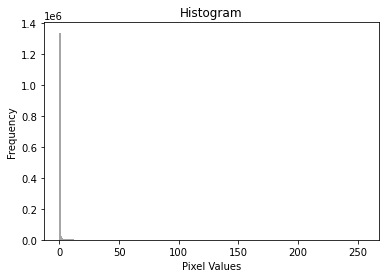

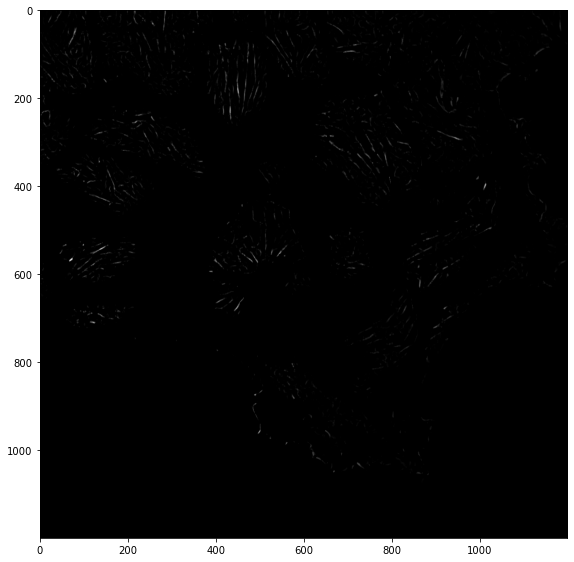

In [36]:
normalized_image = cv2.normalize(ed_frangi, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

print("Original unique values:", np.unique(ed_frangi))
print("Normalized unique values:", np.unique(normalized_image))

plot_histogram(normalized_image)
show(normalized_image)

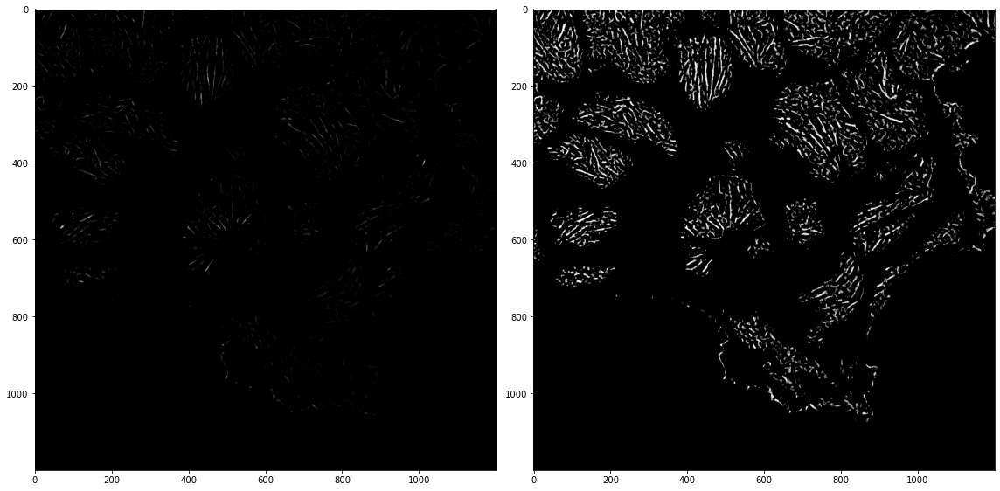

In [37]:
image = normalized_image
eq_image = cv2.equalizeHist(image)

hist,bins = np.histogram(image.flatten(),256,[0,256])
eq_hist,eq_bins = np.histogram(eq_image.flatten(),256,[0,256])

show(image, eq_image)

In [38]:
image_color = convert_gray_to_rgb(equalized_image2)

color_mask = np.zeros_like(image_color)
color_mask[eq_image > eq_image.mean()] = [0, 0, 255]
highlighted_image1 = cv2.addWeighted(image_color, 1.0, color_mask, 0.5, 0)

image_color = convert_gray_to_rgb(equalized_image1)

color_mask = np.zeros_like(image_color)
color_mask[eq_image > eq_image.mean()] = [0, 0, 255]
highlighted_image2 = cv2.addWeighted(image_color, 1.0, color_mask, 0.5, 0)

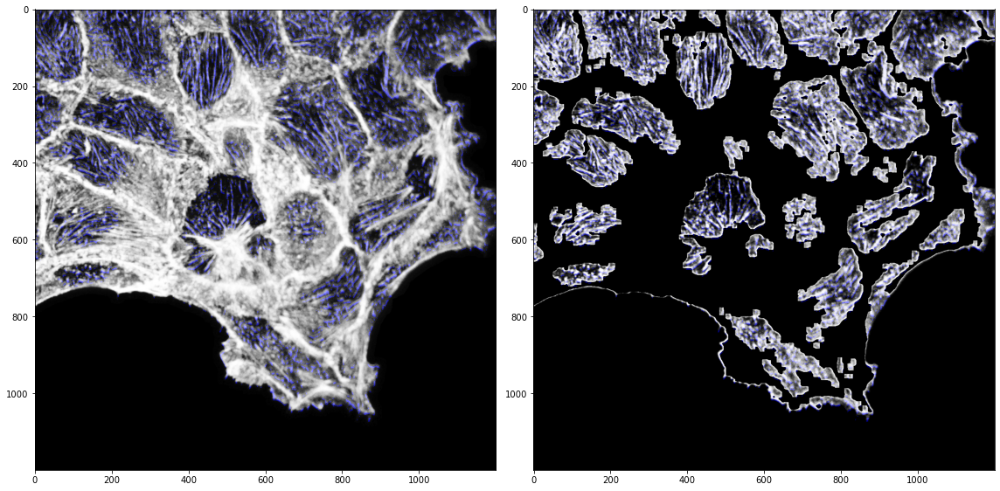

In [39]:
show(highlighted_image1, highlighted_image2)

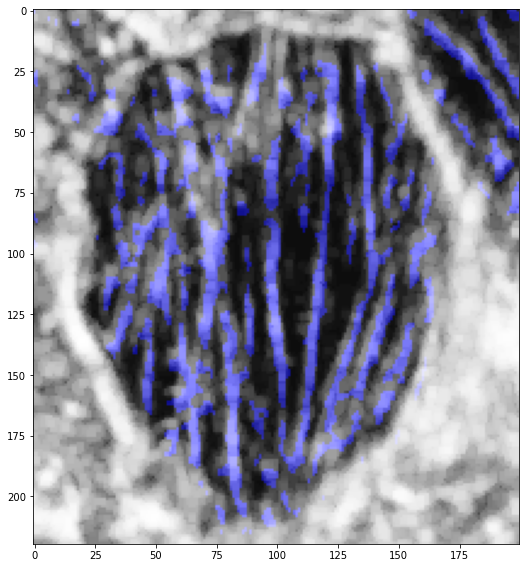

In [40]:
top_left = (350, 50)  
bottom_right = (550, 270) 

cropped_image = highlighted_image1[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]

show(cropped_image)

Despite the challenging presence of noise and the complex nature of the fibers, the obtained results are quite satisfactory. 

[Go to the beginning of the assignment](#home)
<a id="Analyze"></a><br/><br/>
<u>Analyze the length and thickness of the detected stress fibers</u>

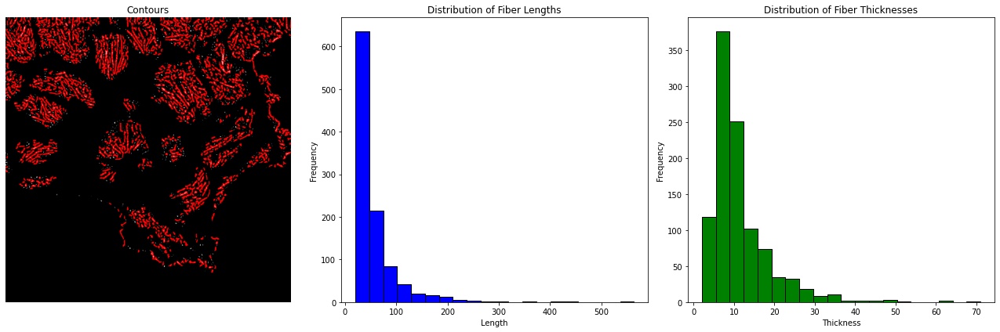

In [51]:
contours, _ = cv2.findContours(eq_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

drawn_image = cv2.cvtColor(eq_image.copy(), cv2.COLOR_GRAY2BGR)

data = []
indexed_contours = []  


# For each contour (fiber), calculate the length and thickness
for contour in contours:
    # The length is the perimeter of the contour
    length = cv2.arcLength(contour, True)

    # The thickness can be estimated as the min value of the bounding rect
    _, _, w, h = cv2.boundingRect(contour)
    thickness = min(w, h)

    # Only append the data if length is greater than 20 and thickness is greater than 1
    if length > 20 and thickness > 1:        
        indexed_contours.append(contour)
        data.append((len(indexed_contours)-1, length, thickness))  # Append the index from indexed_contours

        # Draw the contour on the image in red
        cv2.drawContours(drawn_image, [contour], 0, (0, 0, 255), 2)  # 0 means draw the first contour in the list

# Convert the data list into a pandas DataFrame for easier data manipulation
df = pd.DataFrame(data, columns=['ContourIndex', 'Length', 'Thickness'])

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

ax[0].imshow(cv2.cvtColor(drawn_image, cv2.COLOR_BGR2RGB))  # Convert back to RGB for visualization in matplotlib
ax[0].set_title('Contours')
ax[0].axis('off')

ax[1].hist(df['Length'], bins=20, color='blue', edgecolor='black')
ax[1].set_title('Distribution of Fiber Lengths')
ax[1].set_xlabel('Length')
ax[1].set_ylabel('Frequency')

ax[2].hist(df['Thickness'], bins=20, color='green', edgecolor='black')
ax[2].set_title('Distribution of Fiber Thicknesses')
ax[2].set_xlabel('Thickness')
ax[2].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [52]:
df

,ContourIndex,Length,Thickness
0,0,28.485281,7
1,1,42.384776,8
2,2,31.556349,6
3,3,28.142135,9
4,4,32.142135,9
...,...,...,...
1036,1036,26.828427,3
1037,1037,46.727922,8
1038,1038,47.798990,10
1039,1039,74.769552,17


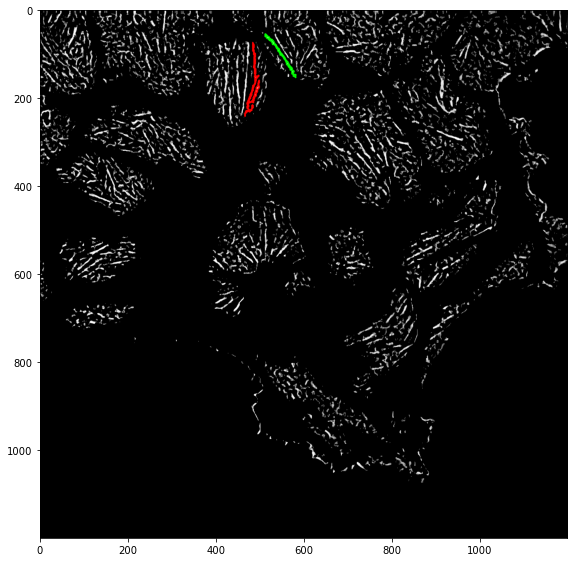

Longest Fiber Length (red): 563.8893901109695
Thickest Fiber (green): 71


In [53]:
image = cv2.cvtColor(eq_image.copy(), cv2.COLOR_GRAY2BGR)

# Draw the contour of the longest fiber on the image in red
longest_fiber_index = df.loc[df['Length'].idxmax(), 'ContourIndex']
longest_fiber = df['Length'].max()
cv2.drawContours(image, [indexed_contours[int(longest_fiber_index)]], -1, (0, 0, 255), 2)

# Draw the contour of the thickest fiber on the image in green
thickest_fiber_index = df.loc[df['Thickness'].idxmax(), 'ContourIndex']
thickest_fiber = df['Thickness'].max()

cv2.drawContours(image, [indexed_contours[int(thickest_fiber_index)]], -1, (0, 255, 0), 2)

show(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

print(f"Longest Fiber Length (red): {longest_fiber}")
print(f"Thickest Fiber (green): {thickest_fiber}")

In [54]:
avg_length = df['Length'].mean()
avg_thickness = df['Thickness'].mean()

print(f"Longest Fiber Length: {longest_fiber}")
print(f"The Thickest Fiber: {thickest_fiber}")

print(f"Average Length of Fibers: {avg_length}")
print(f"Average Thickness of Fibers: {avg_thickness}")

Longest Fiber Length: 563.8893901109695
The Thickest Fiber: 71
Average Length of Fibers: 54.02828378384212
Average Thickness of Fibers: 11.274735830931796
